## IBM Data Science Professional Certificate - Capstone Final Project
## Housing Market and Venues Data - Analysis of Düsseldorf
##### 
##### 

## Table of contents <a name="contents"></a>
* [1. Introduction: Background Discussion](#introduction)
* [2. Data Description](#data)
* [3. Methodology](#methodology)
 * [3.1. Library sources](#3.1)
 * [3.2. Districts and Boroughs](#3.2)
 * [3.3. Population per Borough](#3.3)
 * [3.4. Housing Information](#3.4)
 * [3.5. Venues - Exploring Boroughs of Düsseldorf](#3.5)
 * [3.6. Venues - Analyzing each Borough](#3.6)
 * [3.7. Housing Information - Analyzing each Borough](#3.7)
* [4. Results](#results)
 * [4.1. Results from Venues Analysis](#4.1)
 * [4.2. Results from Housing Analysis](#4.2)
* [5. Discussion](#discussion)
* [6. Conclusion](#conclusion)


## 1. Introduction: Background Discussion <a name="introduction"></a>

North Rhine-Westphalia (NRW) is the most populous of the 16 states of Germany with almost 18 Million inhabitants. Although Cologne, with around 1 Million inhabitants, is the biggest city of this state, the state's capital goes by the name **Düsseldorf**, a city with roughly **600.000 inhabitants**.

Lying on the sides of the Rhine River, Düsseldorf has been consistently considered one of the top cities in the world in terms of quality of living, according to sources such as Mercer's Quality of Living Ranking. Having also one of the top 3 busiest airports in Germany, Düsseldorf holds a vibrant expat community. This is a city which is an international business and financial centre, renowned for its fashion and trade fairs.

This project will approach a scenario where a person who holds close to no knowledge of Düsseldorf, has the chance to move to this city. One of the first and most daunting steps to undertake such challenge is precisely to find housing in this unknown city, and to acquire some grasp of the "best" places and locations. 

We will then work on a methodology which will be an exercise to **cluster** the **housing information** and the **venues** of this small but dense center. 
##### 
[Back to the table of contents](#contents)

## 2. Data Description <a name="data"></a>

In order to develop this project, the data used is as follows:

* **Table of city district and boroughs**: Wikipedia page - list of city boroughs of Düsseldorf. This information will be the setting stone of the project, as all remaining information will be joined to this base. https://de.wikipedia.org/wiki/Liste_der_Stadtbezirke_von_D%C3%BCsseldorf

* **Inhabitants of Düsseldorf - 2019**: City Population website. Our goal is to be able to map this information in a Choropleth Map in order to understand the dynamics of where do people tend to reside.
http://www.citypopulation.de/en/germany/dusseldorf/admin/

* **Housing information (apartments for rent)**: Immobilien Scout 24. https://www.immobilienscout24.de/ 
 
 This is one of the most know portals to find housing in Germany. The searching configurations are:
 * Location: City of Düsseldorf (all boroughs)
 * Price: up to € 3.500 Euro
 * Number of Rooms: from 1 to 3 rooms


* **GeoJSON with the Boroughs of Düsseldorf**: Open Data Düsseldorf. Which will be essential to create some Choropleth Maps. https://opendata.duesseldorf.de/dataset/stadtteilgrenzen-d%C3%BCsseldorf

* **Venues of Düsseldorf**: We will use the **FourSquare API** to retrieve the most common Venues of Düsseldorf by borough.

##### 
[Back to the table of contents](#contents)

## 3. Methodology <a name="methodology"></a>

 ### 3.1 Library sources <a name="3.1"></a>

In [1]:
# Import required libraries for scrapping
import urllib.request
from bs4 import BeautifulSoup
import json # library to handle JSON files
import requests # library to handle requests

import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Regular Expressions to collect the addresses
import re

# Get the same number of district cells as boroughs
from itertools import chain

# convert an address into latitude and longitude values
from geopy.geocoders import Nominatim 

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
%matplotlib inline

# import k-means from clustering stage
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

# map rendering library
import folium

# Another ploting library
import seaborn as sns

# Class object has been created to store the credentials for safekeeping
import credentials_oa_outlk as cred

print('Libraries imported.')

##########################################################

#from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
#import smtplib

Libraries imported.


##### 
[Back to the table of contents](#contents)
### 3.2. Districts and Boroughs <a name="3.2"></a>
The setting stone of the project consists on the collection of the information base for the city of Düsseldorf. We start by scraping the Districts (Stadtbezirke) and Boroughs (Stadtteile) from Wikipedia.

In [2]:
# Source
url_wiki = 'https://de.wikipedia.org/wiki/Liste_der_Stadtbezirke_von_D%C3%BCsseldorf'
page = requests.get(url_wiki)

# Parsing through the URL
soup = BeautifulSoup(page.content, 'html.parser')
print("Data parsed.")

# Identify the table to scrap
right_table = soup.find('table', class_ = 'wikitable sortable')
print("Table located.")

Data parsed.
Table located.


##### 
#### Assigning Districts and Boroughs to DataFrame

In [3]:
# Set the dataframe columns || Create empty dataframe with the same structure of the original table
column_names = ['District','Borough','Fläche','Einwohner','Bewölkerungsdichte','Bezirkvorsteher','K','Karte']
df = pd.DataFrame(columns = column_names)

# Load the dataframe with the information || clear the information down to the 2 columns needed
for tr_cell in right_table.find_all('tr'):
    row_data = []
    for td_cell in tr_cell.find_all('td'):
        row_data.append(td_cell.text.rstrip())
        
    if len(row_data)>0:
        df.loc[len(df)] = row_data
        
df = df[['District', 'Borough']]
print(df.head(2),'\n')

# Remove numeric digits from the Boroughs 
df.set_index(['District', 'Borough'])  
df = df.replace(regex=r'[0-9]+', value=',')

# As the numeric digit has been removed from the District Column, 
# we need to add the number of each district as per the current index 
district_numb = ['1','2','3','4','5','6','7','8','9','10']
df['district_numb'] = district_numb

df.head(2)

           District                                            Borough
0  Stadtbezirk 1[1]  011 Altstadt012 Carlstadt013 Stadtmitte014 Pem...
1  Stadtbezirk 2[2]     021 Flingern Süd022 Flingern Nord023 Düsseltal 



,District,Borough,district_numb
0,"Stadtbezirk ,[,]",", Altstadt, Carlstadt, Stadtmitte, Pempelfort,...",1
1,"Stadtbezirk ,[,]",", Flingern Süd, Flingern Nord, Düsseltal",2


##### 
As we can see, the table brings originally data that we don't require for this project. Therefore, the sequential numerical codes assigned to each Borough were removed in the previous bit of code. 
Our next focus will be to get the first clean dataframe, which will hold one row for each Borough, and it's relative District.

In [4]:
# Get several district cells for each borough
# Return list from series of comma-separated strings
def chainer(s):
    return list(chain.from_iterable(s.str.split(', ')))

# calculate lengths of splits
lens = df['Borough'].str.split(', ').map(len)

# create new dataframe, repeating or chaining as appropriate
res = pd.DataFrame({'District': np.repeat(df['District'], lens),
                    'Borough': chainer(df['Borough']),
                    'district_numb': np.repeat(df['district_numb'], lens)})

# Strip empty cells ""
res = res[res['Borough'].str.strip().astype(bool)]

# Concatenate the district to include the number for each district
res['Dis'] = res['District'].str[:11] 
res['District'] = res['Dis']+' '+res['district_numb']

# Finalize the dataframe with districts and boroughs of Düsseldorf
df_boroughs = res[['District','Borough']]
df_boroughs = df_boroughs.reset_index(drop=True)


print('Scraping of Districts and Boroughs completed!\n')
df_boroughs.head(2)

Scraping of Districts and Boroughs completed!



,District,Borough
0,Stadtbezirk 1,Altstadt
1,Stadtbezirk 1,Carlstadt


##### 
#### Getting the Coordinates for the city of Düsseldorf
We are now ready to add the coordinates to our dataframe. At first we gather the geographical coordinates for the city of Düsseldorf, which will be stored for later usage in map rendering. 
We gather also the coordinates for each Borough of Düsseldorf, and store this information in the main dataframe.

In [5]:
# Getting the Coordinates for Düsseldorf

address = 'Düsseldorf, NRW'
geolocator = Nominatim(user_agent="duesseldorf_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

print('The geograpical coordinate of Düsseldorf are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Düsseldorf are 51.2254018, 6.7763137.


In [6]:
# Getting the Coordinates for each Borough

city = 'Düsseldorf, Germany'
boroughs  = df_boroughs['Borough']
coord = {'latitude':[],'longitude':[]}
for borough in boroughs:
    address = borough + ', ' + city
    location = geolocator.geocode(address)
    lat = location.latitude
    coord['latitude'].append(lat)
    lng = location.longitude
    coord['longitude'] .append(lng)
    
    print(address, lat, lng)

Altstadt, Düsseldorf, Germany 51.2259125 6.7735672
Carlstadt, Düsseldorf, Germany 51.2221416 6.7733942
Stadtmitte, Düsseldorf, Germany 51.2219385 6.7844229
Pempelfort, Düsseldorf, Germany 51.2396009 6.7796845
Derendorf, Düsseldorf, Germany 51.2445487 6.7922488
Golzheim, Düsseldorf, Germany 51.2507945 6.7599633
Flingern Süd, Düsseldorf, Germany 51.2210094 6.8100603
Flingern Nord, Düsseldorf, Germany 51.2313815 6.8132378
Düsseltal, Düsseldorf, Germany 51.2378412 6.812116
Friedrichstadt, Düsseldorf, Germany 51.2135645 6.7816997
Unterbilk, Düsseldorf, Germany 51.210055 6.7669651
Hafen, Düsseldorf, Germany 51.2170292 6.7335758
Hamm, Düsseldorf, Germany 51.2035725 6.7388087
Volmerswerth, Düsseldorf, Germany 51.1885784 6.7490097
Bilk, Düsseldorf, Germany 51.2027583 6.7851015
Oberbilk, Düsseldorf, Germany 51.2136887 6.8024279
Flehe, Düsseldorf, Germany 51.1922044 6.7717128
Oberkassel, Düsseldorf, Germany 51.2295816 6.7554498
Heerdt, Düsseldorf, Germany 51.2323927 6.7201136
Lörick, Düsseldorf, 

In [7]:
# Adding the coordinates to the main dataframe and check the information

df_boroughs['latitude'] = coord['latitude']
df_boroughs['longitude'] = coord['longitude']
df_boroughs.head()

,District,Borough,latitude,longitude
0,Stadtbezirk 1,Altstadt,51.225912,6.773567
1,Stadtbezirk 1,Carlstadt,51.222142,6.773394
2,Stadtbezirk 1,Stadtmitte,51.221939,6.784423
3,Stadtbezirk 1,Pempelfort,51.239601,6.779685
4,Stadtbezirk 1,Derendorf,51.244549,6.792249


Let's use **Folium** to render a map in order to allow a look at Düsseldorf's Boroughs.


In [8]:
# create map of Düsseldorf using latitude and longitude values
map_dusseldorf = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, district, borough in zip(df_boroughs['latitude'], df_boroughs['longitude'], df_boroughs['District'], df_boroughs['Borough']):
    label = '{}, {}'.format(borough, district)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_dusseldorf)  
    
map_dusseldorf

##### 
[Back to the table of contents](#contents)
### 3.3. Population per Borough <a name="3.3"></a>
The site "City Population" provides a source for 5 different temporal stamps covering a period between 2002 and 2019, for the sake of simplicity we will end up scrapping the data just for most recent year. 
The information gathered in this step is the **Borough** name of this table, which will be used to merge to the main dataframe, and the **Population** per Borough for the year of **2019**.

In [9]:
# Source
url_hab = 'http://www.citypopulation.de/en/germany/dusseldorf/admin/'
page = requests.get(url_hab)

# Parsing through the URL
soup = BeautifulSoup(page.content, 'html.parser')

In [10]:
# Scrape the information into two lists
pop_2018 = {'Borough':[], 'Population':[]}

# Get the Borough name from the table
for n in soup.find_all(itemprop="name"):
    n = n.decode()
    stuff = re.findall((r">(.*)\<"), n)
    if len(stuff) == 0:
        continue
    else:
        temp = []
        temp.append(stuff)
        for sublist in temp:
            for item in sublist:
                pop_2018['Borough'].append(item)
    
#Remove Continent and Country names + Removing old borough that was surpressed            
pop_2018['Borough'] = pop_2018['Borough'][3:45]+pop_2018['Borough'][46:] 

# Get the Population data
for p in soup.find_all('td', class_=['admin2', 'rpop prio1']):
        p = p.decode()
        stuff = re.findall((r'[0-9][0-9,.]+'),p)
        if len(stuff) == 0:
            continue
        else:
            temp = []
            temp.append(stuff)
            for sublist in temp:
                for item in sublist:
                    pop_2018['Population'].append(item)

# Store the information into a Pandas DataFrame
pd_name = pd.Series(pop_2018['Borough'], dtype=object)
pd_pop = pd.Series(pop_2018['Population'], dtype=object)
population = pd.concat([pd_name, pd_pop], axis=1, sort=False)
population.columns = ['Borough', 'Population']
population.head()

,Borough,Population
0,Stadtbezirk 1,"86,595"
1,Altstadt,"2,453"
2,Carlstadt,"2,281"
3,Derendorf,"20,760"
4,Golzheim,"12,861"


#### 
#### Adding the Population to main the DataFrame

In [11]:
# Merge Population fatarame to the main dataframe (now named df_dusseldorf)
df_dusseldorf = pd.merge(df_boroughs, population[['Borough','Population']],on='Borough')

# Remove commas from Population values || Convert to integer
df_dusseldorf['Population'] = df_dusseldorf['Population'].str.replace(",","").astype(int)
df_dusseldorf

,District,Borough,latitude,longitude,Population
0,Stadtbezirk 1,Altstadt,51.225912,6.773567,2453
1,Stadtbezirk 1,Carlstadt,51.222142,6.773394,2281
2,Stadtbezirk 1,Stadtmitte,51.221939,6.784423,14958
3,Stadtbezirk 1,Pempelfort,51.239601,6.779685,33282
4,Stadtbezirk 1,Derendorf,51.244549,6.792249,20760
5,Stadtbezirk 1,Golzheim,51.250794,6.759963,12861
6,Stadtbezirk 2,Flingern Süd,51.221009,6.810060,10413
7,Stadtbezirk 2,Flingern Nord,51.231381,6.813238,25464
8,Stadtbezirk 2,Düsseltal,51.237841,6.812116,28077
9,Stadtbezirk 3,Friedrichstadt,51.213564,6.781700,19712


Now that we have the population per Borough, it is interesting to get another grasp of the data that we are dealing with. Our next step is to render a choropleth map with the population of Düsseldorf, in order for us to understand where do people reside. 

In [12]:
# download countries geojson file
!wget --quiet https://opendata.duesseldorf.de/sites/default/files/Stadtteile_WGS84_4326.geojson -O dusseldorf.json
    
print('GeoJSON file downloaded!')

GeoJSON file downloaded!


In [13]:
dusseldorf_geo = r'dusseldorf.json' # geojson file

def boroughs_style(feature):
    return { 'color': 'grey', 'fill': False, 'line_weight' : 0.2, 'line_opacity': 0.5  }

# create a plain map of Düsseldorf
dusseldorf_map = folium.Map(location=[latitude, longitude], zoom_start=11)


In [14]:
# create a numpy array of length 8 and has linear spacing from the minium total population to the maximum total population
threshold_scale = np.linspace(df_dusseldorf['Population'].min(),
                              df_dusseldorf['Population'].max(),
                              8, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum population
  
# generate choropleth map using the population of Düsseldorf for 2019
choropleth = folium.Choropleth(
    geo_data=dusseldorf_geo,
    name = 'choropleth',
    data = df_dusseldorf,
    columns=['Borough', 'Population'],
    key_on='feature.properties.Name',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    highlight=True,
    legend_name='Population of Dusseldorf - 2019'
).add_to(dusseldorf_map)

# Let's add the Boroughs Labels
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['Name'],labels=False)
)
                                                              
# Add Layer Control                                                                  
folium.LayerControl().add_to(dusseldorf_map)
# display map
dusseldorf_map

As we can see from the map above, there is a tendency for the population to aggregate around the city center, and along the trainline which crosses the city from North-South, specially seen in the south side of the city.
This might the first clue that leads us to understand which are the most popular Boroughs to live in Düsseldorf.

In [15]:
# Create a Backup of the Population Data
df_dusseldorf.to_csv('pop_dusseldorf.csv')

###### 
[Back to the table of contents](#contents)

### 3.4. Housing Information <a name="3.4"></a>

By "Housing Information" our goal is to get the apartments/houses available for rent. In order to collect the information for housing the search parameters are:
* Apartments/Houses available for rent for the city of Düsseldorf (all Boroughs)
* Prices up to €3.500 Euros
* Between 1 and 3 rooms

As the site provides 20 results per page, the scraping script needs to run through several pages in order to collect the information. A While Loop assures that the script will run for as many pages as the site has available - which depends on the number of properties at any given time.

Rather than having a fixed number of pages, an **user input** function could be used, in order for a given number to be provided everytime the script runs, after manual consultation of the page and confirmation of the number of pages that we need to scrape.

For the sake of privacy, and because our goal is to provide a general insight of the information per Borough. We will start by scraping the full address for each apartment/house (when available), we will however end up storing only the Borough for the stated unit.

In [16]:
pnumber = 1 # page number to scrape
housing = {'Address':[], 'Price':[], 'Rooms':[], 'Borough':[]}

# Encompass by the number of pages available for the search result
while pnumber < 63: 
    url_house = 'https://www.immobilienscout24.de/Suche/de/nordrhein-westfalen/duesseldorf/wohnung-mieten?numberofrooms=1.0-3.0&price=-3500.0&sorting=4&pagenumber={}'.format(pnumber)
    headers = {"User-agent": 'Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/83.0.4103.116 Safari/537.36'}

    page = requests.get(url_house, headers=headers)
    
    # Parsing through the URL
    soup = BeautifulSoup(page.content, 'html.parser')
    
    #Check if pages are being scraped
    #print('Page {} scraped'.format(pnumber)) ### Uncomment for control
    
    #Getting Address
    address  = soup.find_all('button')
    
    for a in address:
        a = a.decode()
        stuff = re.findall(("[^<>]+\w+[A-Za-z].\\s+Düsseldorf"), a)
        if len(stuff) == 0:
            continue
        else:
            temp = []
            temp.append(stuff)
            for sublist in temp:
                for item in sublist:
                    housing['Address'].append(item)
    
    #Getting price
    price  = soup.find_all('dd')
    
    for p in price:
        p = p.decode()
        stuff = re.findall(("[^<>]+\\s+€"),p)
        if len(stuff) == 0:
            continue
        else:        
            temp = []
            temp.append(stuff)
            for sublist in temp:
                for item in sublist:
                    housing['Price'].append(item)
    
    #Getting number of rooms
    rooms = soup.find_all(class_=['onlySmall'])
    
    for r in rooms:
        r = r.decode()
        stuff = re.findall(("[>]+[0-9]+[<]"), r)
        if len(stuff) == 0:
            continue
        else:   
            temp = []
            temp.append(stuff)
            for sublist in temp:
                for item in sublist:
                    housing['Rooms'].append(item)
    
    # Scrape the next page and keep running the While Loop
    pnumber = pnumber + 1

print("\nScraping completed.")    


Scraping completed.


In [17]:
# Get only the Borough from the Address Field - Not all houses have the full address
for address in housing['Address']:
    temp = address.split(", ")
    housing['Borough'].append(temp[-2])

pd_borough = pd.Series(housing['Borough'], dtype = object)
pd_price = pd.Series(housing['Price'], dtype = object)
pd_rooms = pd.Series(housing['Rooms'], dtype = object)

# Finishing cleaning the number of rooms
pd_rooms = pd_rooms.str[1]

# Concatenating the Series into a Pandas DataFrame
rooms = pd.concat([pd_borough, pd_price, pd_rooms], axis=1, sort=False)
rooms.columns = ['Borough', 'Price', 'Num_Rooms']

## Cleaning the new DataFrame - Remove NaN
# Turning the numerical values [Price and Number of Rooms] into numbers
rooms = rooms.dropna()
rooms['Price'] = rooms['Price'].map(lambda x: x.rstrip(' €'))
rooms['Price'] = rooms['Price'].str.replace(".","")

## Remove results/values for houses where a range is provided rather than a price
# 7 characters was assumed to be the maximum a number could have (ex.: "3500.00")
wrong_data = rooms[rooms['Price'].map(len) > 7].index
rooms.drop(wrong_data, inplace=True)
rooms['Price'] = rooms['Price'].str.replace(",",".").astype(float) 
rooms['Num_Rooms'] = rooms['Num_Rooms'].astype(int)
print('Number of apartments between 1 and 3 rooms: \n')
rooms['Num_Rooms'].value_counts()

Number of apartments between 1 and 3 rooms: 



2    478
3    425
1    207
Name: Num_Rooms, dtype: int64

Let's first have a quick look at the data we have collected for the housing of Düsseldorf. We will check the correlation of the number of rooms, and the price of the house.  

In [18]:
rooms[['Price','Num_Rooms']].corr()

,Price,Num_Rooms
Price,1.000000,0.635313
Num_Rooms,0.635313,1.000000


Looking good. It seems that there is correlation (expected) between the number of rooms and the overall price. This means naturally that when it's time to look for a home, the number of rooms needs to be taken in consideration.
Let's now plot the information into a Box-Plot, so that we can keep building our knowledge with some visual support.

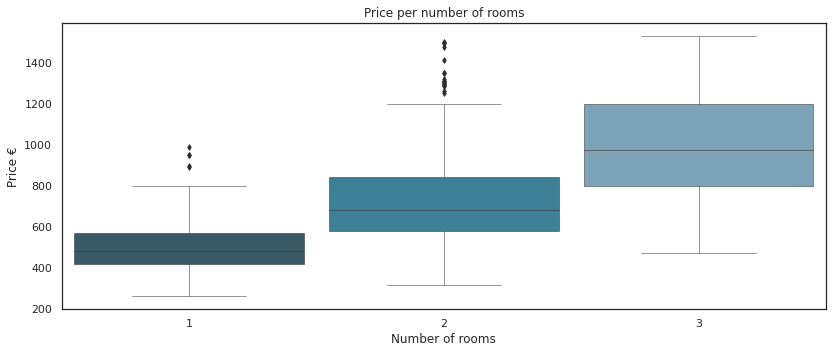

<Figure size 2304x576 with 0 Axes>

In [19]:
# Plotting the data to a boxplot
sns.set(rc={'figure.figsize':(13.7,5.27)})
sns.set_style("white")
sns.boxplot(x=rooms['Num_Rooms'], 
            y=rooms['Price'], 
            data=rooms,
            whis=1.5,
            saturation=0.65, 
            width=0.9,
            linewidth=0.5,
            fliersize=4,
            palette = 'PuBuGn_d')


plt.title('Price per number of rooms')
plt.ylabel('Price €')
plt.xlabel('Number of rooms')
plt.figure(figsize=(32,8))
plt.show()

#### 
In cities worldwide it is common to exist neighbours or boroughs that might be more "posh" and probably more expensive and on the other hand, to have locations that might be more alternative and possibly (not always) more economic. We will also plot the housing information having in consideration the Borough and the Price. This is an interesting exercise which will allow us to start learning some Boroughs names, and the average price of available housing in each one.

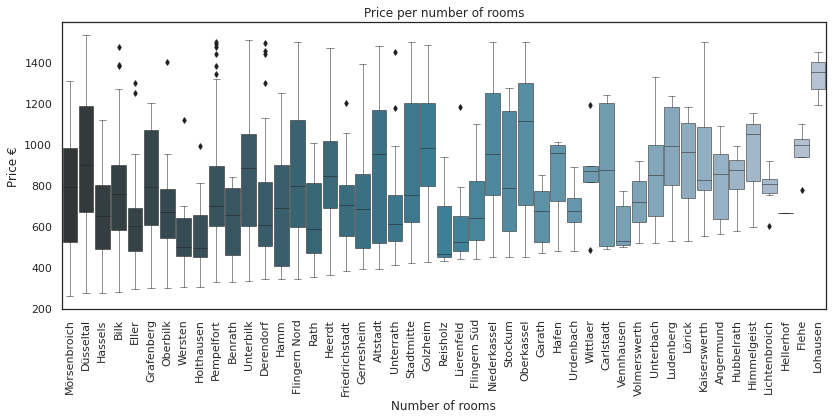

<Figure size 216x576 with 0 Axes>

In [20]:
sns.set_style("white")
sns.boxplot(x=rooms['Borough'], 
            y=rooms['Price'], 
            data=rooms,
            whis=1.5,
            saturation=0.65, 
            width=0.9,
            linewidth=0.5,
            fliersize=4,
            palette = 'PuBuGn_d')

plt.xticks(rotation=90)
plt.title('Price per number of rooms')
plt.ylabel('Price €')
plt.xlabel('Number of rooms')
plt.figure(figsize=(3,8))
plt.show()

#### Merging the information into a single table

After we have gained some insight of which type of information we are looking at, it is now time to group the information into a single dataframe before we can then add this information into the main dataframe.

The number of rooms and the general price needs to be grouped by borough, as that is the level of detail that we are going to analyse, and to compare.

The question at hand is, how should this information be aggregated, using the total number, average values, or median?

As per the article https://www.manausa.com/blog/mean-median-mode-real-estate/, the median is often times the most common choice for the real estate sector, as it represents a value that is not so highly influenced by the extreme values. In this case, we don't want that an apartment which might be on the very high or low end of the facilities and price, as it might cause a big influence on the data for the entire Borough.

Additional information can be found here: https://www.redfin.com/guides/median-sale-price-vs-average-sale-price

We will proceed then by getting the median price, median number of rooms, and total number of houses/apartments available per Borough.

In [21]:
# Group the information per borough 
rooms_grouped1 = rooms.groupby(['Borough'],as_index=False).median()
rooms_grouped2 = rooms.groupby(['Borough'],as_index=False).count()
rooms_grouped = pd.merge(rooms_grouped1, rooms_grouped2[['Borough','Num_Rooms']],on='Borough')
rooms_grouped.rename(columns={'Borough': 'Borough', 'Price': 'Price', 'Num_Rooms_x': 'Rooms', 'Num_Rooms_y':'Houses'}, inplace=True)

# Add the information to the main dataframe
df_dusseldorf = df_dusseldorf.merge(rooms_grouped, how = 'left', on = 'Borough')
df_dusseldorf.fillna(0) # for the case of Boroughs with no apartments for the defined parameters 

,District,Borough,latitude,longitude,Population,Price,Rooms,Houses
0,Stadtbezirk 1,Altstadt,51.225912,6.773567,2453,950.000,2.0,9.0
1,Stadtbezirk 1,Carlstadt,51.222142,6.773394,2281,875.000,2.5,8.0
2,Stadtbezirk 1,Stadtmitte,51.221939,6.784423,14958,750.000,3.0,45.0
3,Stadtbezirk 1,Pempelfort,51.239601,6.779685,33282,700.000,2.0,85.0
4,Stadtbezirk 1,Derendorf,51.244549,6.792249,20760,607.500,2.0,54.0
5,Stadtbezirk 1,Golzheim,51.250794,6.759963,12861,980.000,3.0,37.0
6,Stadtbezirk 2,Flingern Süd,51.221009,6.810060,10413,638.000,2.0,18.0
7,Stadtbezirk 2,Flingern Nord,51.231381,6.813238,25464,797.500,2.0,54.0
8,Stadtbezirk 2,Düsseltal,51.237841,6.812116,28077,900.000,2.0,85.0
9,Stadtbezirk 3,Friedrichstadt,51.213564,6.781700,19712,703.720,2.0,45.0


#### 
We can now try to understand how do the information that we have just collected relates with each other.
A quick look into it induces two factors: the information of the population numbers seem to affect the number of houses/apartments available in a positive way, _ergo_ the higher the number of inhabitants in a given place, the likelyhood of the number of houses available will be higher; and second one, as previously stated, the higher number of rooms indicates that the price migh potentially rise.

In [22]:
df_dusseldorf[['Population','Price','Rooms','Houses']].corr()

,Population,Price,Rooms,Houses
Population,1.000000,-0.355422,-0.258258,0.793023
Price,-0.355422,1.000000,0.699089,-0.076790
Rooms,-0.258258,0.699089,1.000000,-0.125011
Houses,0.793023,-0.076790,-0.125011,1.000000


Mapping the information of the housing median price comes as natural step at this point, as it allows us have a first grasp of which Boroughs have a tendency to be more expensive or cheaper. 

The information mapped below is a visual representation for the median price that we have found for the housing available at the time that this report is being written/updated. As this information is scraped and stored each time that we run the script, the search results change depending of the housing availability at the moment. It is then possible that some Boroughs don't have any apartment/house available for renting - for such cases the Boroughs will be displayed in black. 


In [23]:
# create a plain map of Düsseldorf
price_map = folium.Map(location=[latitude, longitude], zoom_start=11)

In [24]:
# create a numpy array of length 6 and has linear spacing from the minimum median price to the maximum median price
threshold_scale = np.linspace(df_dusseldorf['Price'].min(),
                              df_dusseldorf['Price'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum price
  
# generate choropleth map using the princing information we have collected
choropleth1 = folium.Choropleth(
    geo_data=dusseldorf_geo,
    name = 'choropleth',
    data = df_dusseldorf,
    columns=['Borough', 'Price'],
    key_on='feature.properties.Name',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    highlight=True,
    legend_name='Median housing price € - Dusseldorf'
).add_to(price_map)

# Let's add the Boroughs Labels
choropleth1.geojson.add_child(
    folium.features.GeoJsonTooltip(['Name'],labels=False)
)
                                                              
# Add Layer Control                                                                  
folium.LayerControl().add_to(price_map)
# display map
price_map

###### 
[Back to the table of contents](#contents)

### 3.5. Venues - Exploring Boroughs of Düsseldorf <a name="3.5"></a>

In order to get the bigger picture of what is the reality and the dynamics of the boroughs of Düsseldorf, our next step will be to gather the venues for each borough. The FourSquare API will then be used as the source of the information, as we will gather this from their services. 

We will try to understand the data gathered in this phase, and will use it to create clusters among the boroughs of Düsseldorf. It might be interesting to understand which boroughs are more diverse and dynamic, and which ones might be more calm, or at least, that don't have the same offer of venues.

Later on, an exercise will be developed where we will cross some of the venues that we are gathering with the housing market.



 

In [25]:
# Access Class file with FourSquare API Credentials
cred = cred.Credentials

print('Foursquare credentials imported from Class file.')

Foursquare credentials imported from Class file.


In [26]:
LIMIT = 100 # limit of number of venues returned by Foursquare API

# results # -> Uncomment if needed

After getting the API credentials ready for usage, and the maximum number of venues that we are able to collect, due to limitations on each plan, we  proceed then by defining the function that allows us to gather the data. Due to the large geographical coverage of each borough, we have opted out to create a radius of 1500 meters with a maximum limit of 100 venues. 

In [27]:
def getNearbyVenues(names, latitudes, longitudes, radius=1500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(cred.CLIENT_ID, cred.CLIENT_SECRET, cred.VERSION, lat, lng, radius, LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Borough', 
                  'Borough Latitude', 
                  'Borough Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [28]:
# Run previously created function on all Boroughs and save the result in a DataFrame
dusseldorf_venues = getNearbyVenues(names=df_dusseldorf['Borough'],
                                   latitudes=df_dusseldorf['latitude'],
                                   longitudes=df_dusseldorf['longitude']
                                  )

# Alternative - for when the API is down (only available after 1 successfull run)
#dusseldorf_venues = pd.read_csv('dusseldorf_venues.csv') # --> uncomment if needed

Altstadt
Carlstadt
Stadtmitte
Pempelfort
Derendorf
Golzheim
Flingern Süd
Flingern Nord
Düsseltal
Friedrichstadt
Unterbilk
Hafen
Hamm
Volmerswerth
Bilk
Oberbilk
Flehe
Oberkassel
Heerdt
Lörick
Niederkassel
Stockum
Lohausen
Kaiserswerth
Wittlaer
Angermund
Kalkum
Lichtenbroich
Unterrath
Rath
Mörsenbroich
Gerresheim
Grafenberg
Ludenberg
Hubbelrath
Knittkuhl
Lierenfeld
Eller
Vennhausen
Unterbach
Wersten
Himmelgeist
Holthausen
Reisholz
Benrath
Urdenbach
Itter
Hassels
Garath
Hellerhof


## 
Let's have a look into the data that we were able to gather and store in the dataframe **"dusseldorf_venues"**. 

In [29]:
print(dusseldorf_venues.shape)
dusseldorf_venues.head()

(2292, 7)


,Borough,Borough Latitude,Borough Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Altstadt,51.225912,6.773567,Casita Mexicana,51.226676,6.775478,Mexican Restaurant
1,Altstadt,51.225912,6.773567,Rösterei VIER,51.225940,6.772294,Coffee Shop
2,Altstadt,51.225912,6.773567,Rheinuferpromenade,51.225275,6.770204,Pedestrian Plaza
3,Altstadt,51.225912,6.773567,Rösterei VIER,51.224536,6.773703,Coffee Shop
4,Altstadt,51.225912,6.773567,Elephant Bar,51.226851,6.772636,Cocktail Bar


In [30]:
# Creating a backup of the information to allow the running of the script several times if needed
dusseldorf_venues.to_csv('dusseldorf_venues.csv')

## 
So far so good. The next step is to gather the total number of venues per Borough. 

We can also check how many different categories of venues have we collected in total.

In [31]:
# Getting the number of venues per Borough
tt_venues = dusseldorf_venues.groupby('Borough').count()
tt_venues = tt_venues.sort_values(by=['Venue Category'], axis=0, ascending=True, inplace=False, kind='quicksort')

# Check how many different categories have been found 
print('There are {} uniques categories.'.format(len(dusseldorf_venues['Venue Category'].unique())))

There are 235 uniques categories.


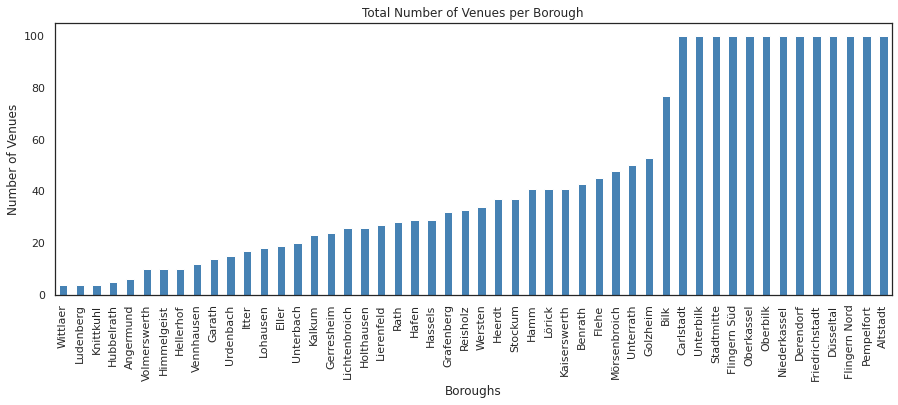

In [32]:
# Plotting the information 
tt_venues['Venue Category'].plot(kind='bar', 
                                 figsize=(15, 5),
                                color = 'steelblue')

plt.title('Total Number of Venues per Borough') # add a title to the histogram
plt.ylabel('Number of Venues') # add y-label
plt.xlabel('Boroughs') # add x-label

plt.show()

We can see that 13 of our boroughs got the maximum amount of venues according to the parameters defined in the searching phase. 

### 
With over 2300 Venues gathered, spreaded in 237 different categories, we render a map for the location of each venue. This allows us to have an idea of the density of the location venues in the city. The map below contains the **location of each venue** identified, in the **blue dots**, and the **boroughs borders** in **light gray**.

As previously stated for the data of the population, the location of this venues tend to be more dense around the center of Düsseldorf, spreading towards North and mostly South, in the later case along the trainline.

In [33]:
# create map of Düsseldorf using latitude and longitude values
map_venues = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map 
for lat, lng, borough, category in zip(dusseldorf_venues['Venue Latitude'], dusseldorf_venues['Venue Longitude'], dusseldorf_venues['Borough'],dusseldorf_venues['Venue Category']):
    label = '{}, {}'.format(borough, category)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_venues)  
    
# Add Boroughs borders to the map
folium.GeoJson(dusseldorf_geo, style_function=boroughs_style, name='geojson').add_to(map_venues)
    
map_venues

###### 
[Back to the table of contents](#contents)

### 3.6. Venues - Analyzing each Borough <a name="3.6"></a>

Our next step focus in the analysis of each borough. The goal at the end of this stage is to create clusters for the boroughs of Düsseldorf, based on the the information of the venues. This hopefully allows to identify how similar, or dissimilar the boroughs are among themselves.

The **K-Means Algorithm** is our choice for the clustering of the information, as it is one of the most common clustering methods of unsupervised learning.

We need to prepare the data for further handling, therefore we proceed with the one-hot encoding process on the data gathered by FourSquare, which will be stored in the dataframe **"dusseldorf_onehot"**. We will also group the information by Borough and mean value for the venues, and store it in the dataframe **"dusseldorf_grouped"**. 


In [34]:
# one hot encoding
dusseldorf_onehot = pd.get_dummies(dusseldorf_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
dusseldorf_onehot['Borough'] = dusseldorf_venues['Borough'] 

# move neighborhood column to the first column
fixed_columns = [dusseldorf_onehot.columns[-1]] + list(dusseldorf_onehot.columns[:-1])
dusseldorf_onehot = dusseldorf_onehot[fixed_columns]

dusseldorf_onehot.head()

,Borough,ATM,Advertising Agency,Airport,Airport Lounge,Airport Service,American Restaurant,Antique Shop,Aquarium,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Badminton Court,Bakery,Bank,Bar,Basketball Court,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bistro,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Burger Joint,Bus Line,Bus Stop,Business Service,Café,Camera Store,Campground,Castle,Caucasian Restaurant,Chinese Restaurant,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Roaster,Coffee Shop,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Costume Shop,Cultural Center,Cupcake Shop,Currywurst Joint,Dance Studio,Deli / Bodega,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Doner Restaurant,Drugstore,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Service,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Football Stadium,Forest,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Hardware Store,Hobby Shop,Hockey Rink,Hookah Bar,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Kebab Restaurant,Korean Restaurant,Lake,Laser Tag,Light Rail Station,Liquor Store,Lounge,Massage Studio,Mediterranean Restaurant,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Mongolian Restaurant,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Venue,Nature Preserve,Nightclub,Office,Opera House,Optical Shop,Organic Grocery,Outdoors & Recreation,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pedestrian Plaza,Perfume Shop,Pet Store,Pharmacy,Photography Studio,Pier,Pizza Place,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Pool Hall,Port,Portuguese Restaurant,Print Shop,Pub,Racecourse,Ramen Restaurant,Record Shop,Recreation Center,Rental Car Location,Rest Area,Restaurant,Rhenisch Restaurant,River,Rock Club,Salad Place,Salon / Barbershop,Sandwich Place,Sauna / Steam Room,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shipping Store,Shoe Store,Shopping Mall,Slovak Restaurant,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,Soup Place,Souvlaki Shop,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Tapas Restaurant,Taverna,Tennis Court,Thai Restaurant,Theater,Track Stadium,Trail,Tram Station,Trattoria/Osteria,Turkish Restaurant,Vacation Rental,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop,Yoga Studio,Zoo Exhibit
0,Altstadt,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Altstadt,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [35]:
# Group by Borough and check the mean value for the venues
dusseldorf_grouped = dusseldorf_onehot.groupby('Borough').mean().reset_index()
dusseldorf_grouped.head()


,Borough,ATM,Advertising Agency,Airport,Airport Lounge,Airport Service,American Restaurant,Antique Shop,Aquarium,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Badminton Court,Bakery,Bank,Bar,Basketball Court,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bistro,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Burger Joint,Bus Line,Bus Stop,Business Service,Café,Camera Store,Campground,Castle,Caucasian Restaurant,Chinese Restaurant,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Roaster,Coffee Shop,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Costume Shop,Cultural Center,Cupcake Shop,Currywurst Joint,Dance Studio,Deli / Bodega,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Doner Restaurant,Drugstore,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Service,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Football Stadium,Forest,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Hardware Store,Hobby Shop,Hockey Rink,Hookah Bar,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Kebab Restaurant,Korean Restaurant,Lake,Laser Tag,Light Rail Station,Liquor Store,Lounge,Massage Studio,Mediterranean Restaurant,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Mongolian Restaurant,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Venue,Nature Preserve,Nightclub,Office,Opera House,Optical Shop,Organic Grocery,Outdoors & Recreation,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pedestrian Plaza,Perfume Shop,Pet Store,Pharmacy,Photography Studio,Pier,Pizza Place,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Pool Hall,Port,Portuguese Restaurant,Print Shop,Pub,Racecourse,Ramen Restaurant,Record Shop,Recreation Center,Rental Car Location,Rest Area,Restaurant,Rhenisch Restaurant,River,Rock Club,Salad Place,Salon / Barbershop,Sandwich Place,Sauna / Steam Room,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shipping Store,Shoe Store,Shopping Mall,Slovak Restaurant,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,Soup Place,Souvlaki Shop,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Tapas Restaurant,Taverna,Tennis Court,Thai Restaurant,Theater,Track Stadium,Trail,Tram Station,Trattoria/Osteria,Turkish Restaurant,Vacation Rental,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop,Yoga Studio,Zoo Exhibit
0,Altstadt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.0,0.02,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.020000,0.0,0.020000,0.000000,0.040000,0.0,0.01,0.0,0.0,0.01,0.02,0.000000,0.0,0.010000,0.0,0.02,0.0,0.02,0.01,0.04,0.0,0.0,0.01,0.000000,0.000000,0.0,0.030000,0.0,0.0,0.0,0.0,0.0,0.0,0.05,0.0,0.020000,0.0,0.060000,0.0,0.0,0.0,0.01,0.01,0.01,0.0,0.0,0.000000,0.0,0.0,0.000000,0.01,0.0,0.0,0.0,0.000000,0.010000,0.0,0.0,0.01,0.0,0.000000,0.0,0.00,0.0,0.01,0.010000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.010000,0.020000,0.0,0.0,0.0,0.000000,0.020000,0.0,0.0,0.0,0.000000,0.000000,0.02,0.0,0.000000,0.000000,0.0,0.0,0.00,0.000000,0.01,0.0,0.060000,0.0,0.010000,0.01,0.000000,0.0,0.000000,0.01,0.010000,0.000000,0.010000,0.01,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0

### 
After defining a function that allows to get the information into a Pandas dataframe, we get the top 10 venues for each Borough of Düsseldorf.



In [36]:
# Getting the information into a Pandas DataFrame

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [37]:
# Get top 10 venues for each Borough

num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Borough']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
boroughs_venues_sorted = pd.DataFrame(columns=columns)
boroughs_venues_sorted['Borough'] = dusseldorf_grouped['Borough']

for ind in np.arange(dusseldorf_grouped.shape[0]):
    boroughs_venues_sorted.iloc[ind, 1:] = return_most_common_venues(dusseldorf_grouped.iloc[ind, :], num_top_venues)

boroughs_venues_sorted.head()

,Borough,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Altstadt,Hotel,Coffee Shop,Clothing Store,Plaza,Brewery,Bar,Wine Bar,Café,Cocktail Bar,Beer Garden
1,Angermund,Supermarket,Restaurant,Pizza Place,Light Rail Station,Bakery,Event Service,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Zoo Exhibit
2,Benrath,Supermarket,Café,Gym,Bakery,Football Stadium,Furniture / Home Store,Bus Line,Bank,Japanese Restaurant,Soccer Field
3,Bilk,Café,Bar,Tram Station,Pizza Place,Beer Store,Ice Cream Shop,Pub,Bistro,Supermarket,Liquor Store
4,Carlstadt,Coffee Shop,Café,Brewery,Hotel,Plaza,Clothing Store,Italian Restaurant,Bar,Park,Bakery


### 
Before applying the K-Means, we need to calculate the ideal amount of clusters that should apply. 

After running the **Elbow Method** we can see that the elbow is not very proeminent, which might indicate that there is homogeneity amonth the several boroughs. The closest value to an elbow in this case is the number 3, therefore we will run the K-Means to cluster the information into 3 clusters. 

In [38]:
# How many clusters should be applied // Calculate the elbow method
dusseldorf_grouped.set_index('Borough', inplace=True)
Sum_of_squared_distances = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(dusseldorf_grouped)
    Sum_of_squared_distances.append(km.inertia_)

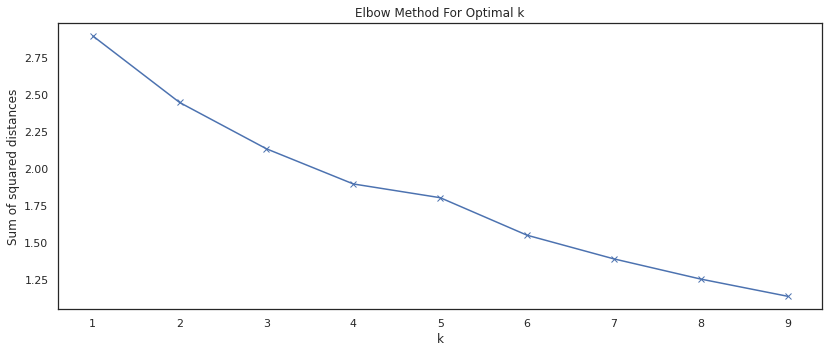

In [39]:
# Plotting the elbow results
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [40]:
dusseldorf_grouped.reset_index(inplace=True)

# set number of clusters
kclusters = 3

dusseldorf_grouped_clustering = dusseldorf_grouped.drop('Borough', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(dusseldorf_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1,
       1, 0, 1, 0, 0, 2, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0,
       0, 0, 1, 0, 1, 0], dtype=int32)

### 
Once the K-Means has been calculated and the clusters defined, we are adding the cluster information onto the main dataframe, now called **"dusseldorf_merged"**.

In [41]:
# add clustering labels
boroughs_venues_sorted.insert(0, 'Cluster_Labels', kmeans.labels_)

dusseldorf_merged = df_dusseldorf

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
dusseldorf_merged = dusseldorf_merged.join(boroughs_venues_sorted.set_index('Borough'), on='Borough')

dusseldorf_merged.head(10) #

,District,Borough,latitude,longitude,Population,Price,Rooms,Houses,Cluster_Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Stadtbezirk 1,Altstadt,51.225912,6.773567,2453,950.00,2.0,9.0,0,Hotel,Coffee Shop,Clothing Store,Plaza,Brewery,Bar,Wine Bar,Café,Cocktail Bar,Beer Garden
1,Stadtbezirk 1,Carlstadt,51.222142,6.773394,2281,875.00,2.5,8.0,0,Coffee Shop,Café,Brewery,Hotel,Plaza,Clothing Store,Italian Restaurant,Bar,Park,Bakery
2,Stadtbezirk 1,Stadtmitte,51.221939,6.784423,14958,750.00,3.0,45.0,0,Coffee Shop,Café,Japanese Restaurant,Hotel,Korean Restaurant,Clothing Store,Ramen Restaurant,Chinese Restaurant,Shopping Mall,Bakery
3,Stadtbezirk 1,Pempelfort,51.239601,6.779685,33282,700.00,2.0,85.0,0,Italian Restaurant,Hotel,Restaurant,Café,Bar,Bakery,Park,Beer Garden,Cocktail Bar,Pizza Place
4,Stadtbezirk 1,Derendorf,51.244549,6.792249,20760,607.50,2.0,54.0,0,Italian Restaurant,Restaurant,Café,Trattoria/Osteria,Bakery,Supermarket,Hotel,Cocktail Bar,Thai Restaurant,German Restaurant
5,Stadtbezirk 1,Golzheim,51.250794,6.759963,12861,980.00,3.0,37.0,0,Restaurant,Hotel,Park,Italian Restaurant,German Restaurant,Trattoria/Osteria,Fast Food Restaurant,Steakhouse,Asian Restaurant,Café
6,Stadtbezirk 2,Flingern Süd,51.221009,6.810060,10413,638.00,2.0,18.0,0,Café,Hotel,Pizza Place,Coffee Shop,Italian Restaurant,Vietnamese Restaurant,Bar,Middle Eastern Restaurant,Turkish Restaurant,Portuguese Restaurant
7,Stadtbezirk 2,Flingern Nord,51.231381,6.813238,25464,797.50,2.0,54.0,0,Café,Hotel,Pizza Place,Vietnamese Restaurant,Greek Restaurant,Italian Restaurant,Gift Shop,Brewery,Portuguese Restaurant,Bar
8,Stadtbezirk 2,Düsseltal,51.237841,6.812116,28077,900.00,2.0,85.0,0,Café,Hotel,Supermarket,Bakery,Pizza Place,German Restaurant,Italian Restaurant,Greek Restaurant,Vietnamese Restaurant,Thai Restaurant
9,Stadtbezirk 3,Friedrichstadt,51.213564,6.781700,19712,703.72,2.0,45.0,0,Café,Bar,Coffee Shop,Italian Restaurant,Japanese Restaurant,Chinese Restaurant,Pub,Park,Grocery Store,Korean Restaurant


### 
Grouping the total values of the most common venue allows us to have a look into the clusters, so that a proper name/categorization can be applied.

In [42]:
# Getting the most common venue for each Cluster
count_venue = dusseldorf_merged
count_venue = count_venue.drop(['Borough','District', 'latitude', 'longitude'], axis=1)
count_venue = count_venue.groupby(['Cluster_Labels','1st Most Common Venue']).size().reset_index(name='Counts')

#we can transpose it to plot bar chart
cv_cluster = count_venue.pivot(index='Cluster_Labels', columns='1st Most Common Venue', values='Counts')
cv_cluster = cv_cluster.fillna(0).astype(int).reset_index(drop=True)
cv_cluster

1st Most Common Venue,Bar,Brewery,Café,Clothing Store,Coffee Shop,German Restaurant,Hotel,Italian Restaurant,Metro Station,Platform,Plaza,Restaurant,Supermarket
0,1,1,6,1,2,3,4,3,2,1,1,3,3
1,0,0,0,0,0,0,1,0,0,0,0,2,15
2,0,0,0,0,0,1,0,0,0,0,0,0,0


Text(0, 0.5, 'Number of Venues')

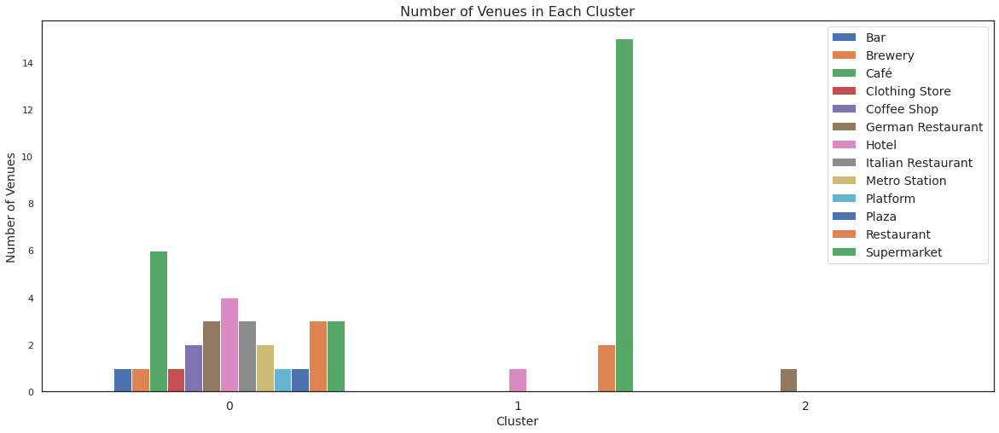

In [43]:
#creating a bar chart of "Number of Venues in Each Cluster"
frame=cv_cluster.plot(kind='bar',figsize=(20,8),width = 0.8)

plt.legend(labels=cv_cluster.columns,fontsize= 14)
plt.title("Number of Venues in Each Cluster",fontsize= 16)
plt.xticks(fontsize=14)
plt.xticks(rotation=0)
plt.xlabel('Cluster', fontsize=14)
plt.ylabel('Number of Venues', fontsize=14)

### 
With the information from the plot above, we can then consider the following categories for each cluster:

* **Cluster 0** - Multiple Social Venues
* **Cluster 1** - Supermarkets
* **Cluster 3** - Restaurants

This information will be used for further analysis in the results chapter below.

In [44]:
# Some Neighborhoods show 'NA' - Need to remove those Neighborhoods // Drop Rows
# Last data handling on this dataframe before plotting a map further down

dusseldorf_merged = dusseldorf_merged.dropna()

dusseldorf_merged['Cluster_Labels'] = dusseldorf_merged.Cluster_Labels.astype(int)


###### 
[Back to the table of contents](#contents)

### 3.7. Housing Information - Analyzing each Borough <a name="3.7"></a>

At this stage, we try to combine some details related with the housing market, in order to come to a clustering system that might help us to identify some patterns and potentially better locations. This analysis will be done by borough, therefore the data below follows this structure.

From the data that was originaly scraped, the information selected is:
* Median renting price
* Number of houses available/advertised
##### 

It was decided to add to this list, a few amenities that we have gathered with the FourSquare API, which are considered desirable to have near home:
* Number of Supermarkets
* Number of Bakeries
* Number of Gyms/ Fitness Centers
* Number of Gyms


In [45]:
# One hot on housing data
df_duss_clean = df_dusseldorf[['Borough','Price','Houses']]
dusseldorf_grouped_tt = dusseldorf_onehot.groupby('Borough').sum().reset_index()
housing = pd.merge(df_duss_clean, dusseldorf_grouped_tt[['Borough','Supermarket','Bakery', 'Gym / Fitness Center', 'Gym']],on='Borough')

housing.head()

,Borough,Price,Houses,Supermarket,Bakery,Gym / Fitness Center,Gym
0,Altstadt,950.0,9.0,0,2,0,0
1,Carlstadt,875.0,8.0,1,2,1,0
2,Stadtmitte,750.0,45.0,1,3,1,0
3,Pempelfort,700.0,85.0,1,3,1,0
4,Derendorf,607.5,54.0,4,4,2,0


In [46]:
# Normalizing the data
housing_clean = housing.drop(['Borough'], axis=1)
mms = MinMaxScaler()
mms.fit(housing_clean)
data_transformed = mms.transform(housing_clean)

# Replace NaN for 
data_transformed[np.isnan(data_transformed)] = 0

### 
Once the data has been normalized, the **Elbow Method** is used to calculate the optimal number of clusters for the new set of data.



In [47]:
# How many clusters should be applied
#housing.set_index('Borough', inplace=True)
#housing.fillna(0).astype(float)
Sum_of_squared_distances = []
K2 = range(1,10)
for k in K2:
    km = KMeans(n_clusters=k)
    km = km.fit(data_transformed)
    Sum_of_squared_distances.append(km.inertia_)

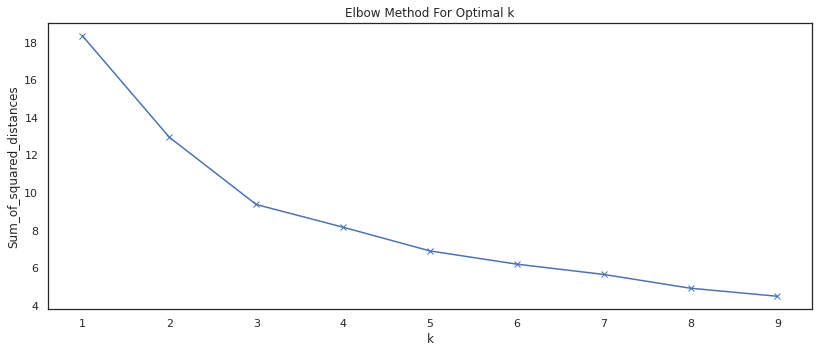

In [48]:
plt.plot(K2, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

### 


The K-Means method will be used to cluster the data into 3 clusters. Once each cluster has been calculated for each borough, the cluster category is added to the housing dataframe, now called "**housing_merged**".

In [49]:
# set number of clusters
kclusters = 3

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(data_transformed)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 0, 0, 0, 2, 2, 1, 0, 0, 2, 2, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1,
       1, 0, 1, 1, 1, 0], dtype=int32)

In [50]:
# add clustering labels
housing.insert(0, 'Housing_Cl_Labels', kmeans.labels_)

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
housing_merged = df_dusseldorf.join(housing[['Borough','Housing_Cl_Labels']].set_index('Borough'), on='Borough')

housing_merged.head(2) #

,District,Borough,latitude,longitude,Population,Price,Rooms,Houses,Housing_Cl_Labels
0,Stadtbezirk 1,Altstadt,51.225912,6.773567,2453,950.0,2.0,9.0,0
1,Stadtbezirk 1,Carlstadt,51.222142,6.773394,2281,875.0,2.5,8.0,0


### 
In order to properly label and categorize each one of our housing boroughs, we group the information by borough based on the **mean value** for the **housing price**, **number of units available**, and **number of selected venues** present.

In [51]:
housing['Venues_Sum'] = housing['Supermarket'] + housing['Bakery'] + housing['Gym / Fitness Center'] + housing['Gym'] 
cv_housing = housing.groupby(['Housing_Cl_Labels'],as_index=False).mean()



cv_housing_filtered = cv_housing[['Housing_Cl_Labels', 'Price', 'Houses', 'Venues_Sum']]

cv_housing_filtered.head()

,Housing_Cl_Labels,Price,Houses,Venues_Sum
0,0,886.235000,11.200000,1.636364
1,1,636.591333,19.400000,6.562500
2,2,776.797917,49.583333,6.666667


As per the table above, we can describe each housing cluster as:
* **Cluster 0** - Highest prices, lowest number of units available, lowest number of selected venues available
* **Cluster 1** - Lowest prices, low number of units available, high number of selected venues available
* **Cluster 2** - Median prices, highest number of units available, highest number of selected venues available


### 
Before rendering the information onto a map, we are gathering the venues related with the transportation network.
The goal of this step is to include the transportation data in the map, for visual reinforcement of the information. The venues considered for this step are as follows:
* Metro Station
* Tram Station
* Light Rail Station
* Bus Stop

In [52]:
# select the transportation categories/venues
match = ['Metro Station', 'Tram Station', 'Light Rail Station', 'Bus Stop']

# defining the function to identify multiple venues // Boolean
def string_finder(row, words):
    if any(word in field for field in row for word in words):
        return True
    return False

# adding the Boolean column to the dataframe
dusseldorf_venues['isContained'] = dusseldorf_venues.astype(str).apply(string_finder, words=match, axis=1)

# creating dataframe with the transportation information
transport = dusseldorf_venues.loc[dusseldorf_venues['isContained'] == True]

###### 
[Back to the table of contents](#contents)
## 4. Results<a name="results"></a>

The results are divided in two sub chapters. In the first instance we refer to the results of the methodology developed with the **venues data** for the boroughs of Düsseldorf. 

As for the second sub chapter, we make a brief analysis on the results of the methodology developed for the **housing data**, and emphasize some hints that we might have gathered at this point.


### 4.1. Results from Venues Analysis<a name="4.1"></a>
At this stage a map is rendered with the Clusters of the venues of Düsseldorf, which should give a valuable insight for which boroughs are more dynamic and have a diverse variety of venues - ***Cluster 0***. 

On the other end, there are two other groups of clusters, where the boroughs that fall on these categories are in general less diversified than the first one, either due to the number of supermarkets that might surpass the other venues - **Cluster 1**, or because the restaurant(s) is the category that stands out - **Cluster 2**.

In [53]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=10)

# Add Boroughs borders to the map
folium.GeoJson(dusseldorf_geo, style_function=boroughs_style, name='geojson').add_to(map_clusters)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(dusseldorf_merged['latitude'], dusseldorf_merged['longitude'], dusseldorf_merged['Borough'], dusseldorf_merged['Cluster_Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)

map_clusters.save('cluster.html')    
map_clusters

### 4.2. Results from Housing Analysis<a name="4.2"></a>

Assuming that the purpose is to find a place that has a higher probability of providing the desired venues nearby, and if time is short to look for a home, the boroughs that fall on the **Cluster 2** might be the first place to look for.

If time is not a bigger problem, but we pretend to give more focus to the economic factor, then the boroughs with **Cluster 1** might provide few, but cheaper opportunities, still with the desired venues nearby.

The boroughs with the **Cluster 0** should be the last place to look for a home according to the defined needs.
As previously stated, the boroughs that fall on the Cluster 0 provide the perfect solution for house hunting, with the only exception on the price.

It was also added a buffer of 500 meters to the transportation venues locations, gathered with the FourSquare API. Now that it has been prioritized the searching order for where to look for housing, it might be important, to find a place well connected to the city's public transportation network.



In [54]:
# create map
map_clusters2 = folium.Map(location=[latitude, longitude], zoom_start=12)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# Add Buffer around the transportation venues
for lat, lon in zip(transport['Venue Latitude'], transport['Venue Longitude']):
    folium.Circle([lat, lon], 
    radius=500, 
    color='#ad842f', 
    fill=True,
    fill_opacity=0.10).add_to(map_clusters2) 

# Add Boroughs borders to the map    
folium.GeoJson(dusseldorf_geo, style_function=boroughs_style, name='geojson').add_to(map_clusters2)
    
# add markers to the map
markers_colors = []
for lat, lon, poi, cluster, price, houses in zip(housing_merged['latitude'], housing_merged['longitude'], housing_merged['Borough'], housing_merged['Housing_Cl_Labels'], housing_merged['Price'], housing_merged['Houses']):
    label = 'Cluster {}, {}EUR, {} Units'.format(cluster, price, houses)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.9).add_to(map_clusters2)

map_clusters2.save('housing.html')
map_clusters2

###### 
[Back to the table of contents](#contents)
## 5. Discussion<a name="discussion"></a>
There are several points worthy to note, as improvement areas for this project:
* More sources for housing - as there are several websites that provide this service, not only the one that was used here. More sources could end up resulting in a more diversified base of information.
* As this case is a typical Geospatial Analysis study, the model would benefit to have a grid analysis where a buffer from a walking distance from bakeries, supermarkets, gyms and so on, could take place, rather than the sheer number of units per Borough. 
* Taking the previous point, it would be interesting to add also the location of bus stops, metro stations, tram stations and the areas of influence (buffer) and analyse how this could benefit the identification for optimal housing search locations. This option would however require a dedicated spacial analysis solution, such as the ArcGIS API for Python. 
* Although the data is normalized, the fact that we opted out for an unsupervised clustering technique, drags with it the lack of control of how each variable is being considered for the methodology. Giving different weights to each variable could proof to be useful, and moreover, to develop a model that could be more malleable - for example to use the **Analytical Hierarchy Process** - a Decision Making Technique in the clustering phase.
More information on https://en.wikipedia.org/wiki/Analytic_hierarchy_process.



###### 
[Back to the table of contents](#contents)
## 6. Conclusion<a name="conclusion"></a>


Like other cities around the world, Düsseldorf shows a predisposition for people and businesses to agglomerate around the city center. As it was displayed in this project, a higher number of people has the tendency to live there, businesses bloom there as well, with a huge variety of options. 

Similar data analysis techniques are on the rise to deal with the daily challenges and opportunities that all cities provide. Now more than ever, with the increasing availability of data, and technology to handle such requests on the go, it is natural that more studies can be conducted, which increases the demand for more and better data analysis.

As final conclusions from this project, it is possible to identify the boroughs that have a more diversified offer of facilities, which overlaps the location were more people reside. And the study performed in the housing market gives some insights of the first locations that one should look for, when looking for housing in Düsseldorf.

From here, the type of house, number of rooms, and other characteristics, will definitely influence the final choice, which might vary on an individual basis. 

# 

_Oscar Antunes_

###### 
[Back to the table of contents](#contents)